In [1]:
!pip install torchvision

In [1]:
import pandas as pd
import numpy as np
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
import torchvision.transforms as T
import os
from PIL import Image
import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision.models.detection import FasterRCNN
from torchvision.models import resnet50
from torchvision.models.detection.rpn import AnchorGenerator
import torch.nn as nn
from torchvision.models.detection.retinanet import RetinaNetHead
from torchvision.models import mobilenet_v3_large
from torchvision.ops import FeaturePyramidNetwork
import itertools
import random
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import _validate_trainable_layers, BackboneWithFPN
from torchvision.ops.feature_pyramid_network import LastLevelMaxPool
from torchvision.models import mobilenet_v2
from torchvision.models._utils import IntermediateLayerGetter


# Data Prep

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(torch.__version__)
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))

2.7.0+cu118
True
NVIDIA GeForce GTX 1080 Ti


In [3]:
csv_path = r"Data\Train_test\Counts_BB.csv"
df = pd.read_csv(csv_path)

# Strip any extra spaces from column names, if needed
df.columns = df.columns.str.strip()

image_dir = r"Data\Train_test"

In [4]:
# Define image dimensions
image_width = 640
image_height = 480

# Convert YOLOv8-style normalized boxes to absolute pixel coordinates
df["x_center"] = df["bb0"] * image_width
df["y_center"] = df["bb1"] * image_height
df["box_width"] = df["bb2"] * image_width
df["box_height"] = df["bb3"] * image_height

# Calculate corners from center format
df["xmin"] = df["x_center"] - (df["box_width"] / 2)
df["ymin"] = df["y_center"] - (df["box_height"] / 2)
df["xmax"] = df["x_center"] + (df["box_width"] / 2)
df["ymax"] = df["y_center"] + (df["box_height"] / 2)
df = df.drop(columns=["x_center", "y_center", "box_width", "box_height"])


In [5]:
class SpermDetectionDataset(Dataset):
    def __init__(self, dataframe, image_dir, transforms=None):
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
        self.image_ids = dataframe['frame_name'].unique()
        self.img_width = 640
        self.img_height = 480

    def __getitem__(self, index):
        image_id = self.image_ids[index]
        image_path = os.path.join(self.image_dir, image_id + ".jpg")

        # Load grayscale image and convert to 1-channel tensor
        image = Image.open(image_path).convert("L")
        

        # Filter bounding boxes for this image
        records = self.df[self.df["frame_name"] == image_id]
        boxes = []

        for _, row in records.iterrows():
            xmin = row["xmin"]
            ymin = row["ymin"]
            xmax = row["xmax"]
            ymax = row["ymax"]
            boxes.append([xmin, ymin, xmax, ymax])


        # Handle images with no sperm (i.e., no boxes)
        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.tensor(boxes, dtype=torch.float32)
            labels = torch.ones((boxes.shape[0],), dtype=torch.int64)  # class 1 for sperm

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([index])
        }

        if self.transforms:
            image = self.transforms(image)

        return image, target

    def __len__(self):
        return len(self.image_ids)

In [6]:
# Split on frame_name to avoid splitting boxes from the same image
unique_frames = df['frame_name'].unique()
train_ids, val_ids = train_test_split(unique_frames, test_size=0.2, random_state=42)

train_df = df[df['frame_name'].isin(train_ids)]
val_df = df[df['frame_name'].isin(val_ids)]

In [7]:

train_transforms = T.Compose([
    T.ToTensor(),  # Converts grayscale image to [1, H, W]
    T.Lambda(lambda x: x.repeat(3, 1, 1)),  # Replicates to [3, H, W]
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Full ImageNet normalization
])

# Pass to dataset
train_dataset = SpermDetectionDataset(train_df, image_dir=image_dir, transforms=train_transforms)
val_dataset = SpermDetectionDataset(val_df, image_dir=image_dir, transforms=train_transforms)



In [8]:
img, target = train_dataset[0]
print(img.shape)  # should be torch.Size([3, 480, 640])

torch.Size([3, 480, 640])


In [9]:

# Custom collate function for object detection
def collate_fn(batch):
    return tuple(zip(*batch))

# Create DataLoaders
train_loader = DataLoader(
    train_dataset,
    batch_size=2,
    shuffle=True,
    num_workers=0,
    collate_fn=collate_fn
)

val_loader = DataLoader(
    val_dataset,
    batch_size=2,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn
)


In [11]:
import torch
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
import torchvision
from torchvision.ops import MultiScaleRoIAlign

def build_model(num_classes=2):
    # Use EfficientNet B0 features as the backbone
    backbone = torchvision.models.efficientnet_b0(weights='DEFAULT').features
    backbone.out_channels = 1280

    # Generate anchors for the RPN
    anchor_generator = AnchorGenerator(
        sizes=((32, 64, 128, 256, 512),),
        aspect_ratios=((0.5, 1.0, 2.0),) * 5
    )

    # RoI Pooling for box heads
    roi_pooler = MultiScaleRoIAlign(
        featmap_names=['0'],
        output_size=7,
        sampling_ratio=2
    )

    # Create Faster R-CNN model
    model = FasterRCNN(
        backbone,
        num_classes=num_classes,
        rpn_anchor_generator=anchor_generator,
        box_roi_pool=roi_pooler
    )
    
    return model


In [12]:
search_space = {
    "lr": [1e-3, 1e-4, 1e-5],
    "weight_decay": [0, 0.0001, 0.0005],
    "step_size": [3, 5],
    "gamma": [0.1, 0.2],
    "anchor_sizes": [((8, 16, 32, 64),), ((16, 32, 64, 128, 256),)],
    "aspect_ratios": [((0.5, 1.0, 2.0),) * 5, ((0.5, 1.0, 1.5, 2.0),) * 5],
    "box_nms_thresh": [0.3, 0.5, 0.7],
    "score_thresh": [0.4, 0.5, 0.6]  # For RetinaNet, this might be used during evaluation
}

keys, values = zip(*search_space.items())
all_combinations = [dict(zip(keys, v)) for v in itertools.product(*values)]
random.seed(42)
sampled_combinations = random.sample(all_combinations, 20) 

In [13]:
from tqdm import tqdm
import time

In [14]:
def validate(model, val_loader, df, device, score_thresh=0.5):
    model.eval()
    total_images = 0
    total_abs_error = 0
    all_true_counts = []
    all_pred_counts = []

    with torch.no_grad():
        for images, targets in tqdm(val_loader, desc="Validating"):

            images = [img.to(device) for img in images]
            outputs = model(images)

            for i, output in enumerate(outputs):
                frame_id = targets[i]['image_id'].item()
                frame_name = val_dataset.image_ids[frame_id]

                scores = output['scores'].cpu()
                pred_count = (scores > score_thresh).sum().item()

                true_count = df[df['frame_name'] == frame_name]['sperm_count'].iloc[0]

                total_abs_error += abs(true_count - pred_count)
                all_true_counts.append(true_count)
                all_pred_counts.append(pred_count)
                total_images += 1

    mae = total_abs_error / total_images
    print(f"🔍 Validation: Mean Absolute Count Error = {mae:.2f}")
    return mae

In [15]:
from torchvision.ops import box_iou

def validate_iou(model, val_loader, df, device, score_thresh=0.5):
    model.eval()
    total_iou = 0
    total_pairs = 0
    iou_list = []

    with torch.no_grad():
        for images, targets in tqdm(val_loader, desc="Validating (IoU)"):
            torch.cuda.empty_cache()
            images = [img.to(device) for img in images]
            outputs = model(images)

            for i, output in enumerate(outputs):
                frame_id = targets[i]['image_id'].item()
                frame_name = val_dataset.image_ids[frame_id]

                scores = output['scores'].cpu()
                boxes_pred = output['boxes'][scores > score_thresh].cpu()
                
                # Get ground truth boxes
                gt_boxes = df[df['frame_name'] == frame_name][['xmin', 'ymin', 'xmax', 'ymax']].values
                boxes_true = torch.tensor(gt_boxes, dtype=torch.float32)

                if len(boxes_pred) == 0 or len(boxes_true) == 0:
                    continue  # Skip if no predictions or ground truth

                # Compute IoU matrix between predicted and true boxes
                ious = box_iou(boxes_pred, boxes_true)

                # Greedy matching: for each predicted box, take best matching GT box
                max_ious, _ = ious.max(dim=1)
                total_iou += max_ious.sum().item()
                total_pairs += len(max_ious)
                iou_list.extend(max_ious.tolist())

    mean_iou = total_iou / total_pairs if total_pairs > 0 else 0
    print(f"📏 Validation: Mean IoU = {mean_iou:.4f}")
    return mean_iou

In [16]:
iou_per_epoch = []
def random_search(train_dataset, val_dataset, param_grid, device, df, num_epochs=2):
    results = []

    for i, config in enumerate(param_grid):
        print(f"\n🔁 Running config {i+1}/{len(param_grid)}: {config}")
        model = build_model(
            # anchor_sizes=config["anchor_sizes"],
            # aspect_ratios=config["aspect_ratios"],
            # box_nms_thresh=config["box_nms_thresh"]
        ).to(device)
        model.train()

        # train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn, num_workers=0)
        # val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn, num_workers=0)

        params = [p for p in model.parameters() if p.requires_grad]
        optimizer = torch.optim.Adam(params, lr=config["lr"], weight_decay=config["weight_decay"])
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=config["step_size"], gamma=config["gamma"])

        for epoch in range(num_epochs):
            epoch_loss = 0.0
            print(f"🧪 Config {i+1}/{len(param_grid)} | Epoch {epoch+1}/{num_epochs}")
            start_epoch = time.time()

            for images, targets in tqdm(train_loader, desc=f"Training (Config {i+1})", leave=False):
                images = [img.to(device) for img in images]
                targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

                try:
                    loss_dict = model(images, targets)
                    losses = sum(loss for loss in loss_dict.values())

                    optimizer.zero_grad()
                    losses.backward()
                    optimizer.step()

                    epoch_loss += losses.item()
                except RuntimeError as e:
                    if "out of memory" in str(e):
                        print("[OOM ERROR] Skipping batch")
                        torch.cuda.empty_cache()
                        continue

            scheduler.step()

            duration = time.time() - start_epoch
            print(f"✅ Epoch {epoch+1}/{num_epochs} done in {duration:.1f}s | Avg Loss: {epoch_loss/len(train_loader):.4f}")

        torch.cuda.empty_cache()
        val_iou = validate_iou(model, val_loader, df, device, score_thresh=config["score_thresh"])
        config_result = config.copy()
        config_result["mean_iou"] = val_iou
        results.append(config_result)

    results_df = pd.DataFrame(results)
    best_config = results_df.loc[results_df["mean_iou"].idxmax()]
    print(f"\n🏆 Best Hyperparameters:\n{best_config}")
    return results_df, best_config


In [17]:
results_df, best_config = random_search(train_dataset, val_dataset, sampled_combinations, device, df)



🔁 Running config 1/20: {'lr': 0.001, 'weight_decay': 0.0001, 'step_size': 5, 'gamma': 0.1, 'anchor_sizes': ((8, 16, 32, 64),), 'aspect_ratios': ((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0)), 'box_nms_thresh': 0.5, 'score_thresh': 0.4}
🧪 Config 1/20 | Epoch 1/2


✅ Epoch 1/2 done in 884.0s | Avg Loss: 0.1136
🧪 Config 1/20 | Epoch 2/2


✅ Epoch 2/2 done in 806.9s | Avg Loss: 0.0901


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:11<00:00,  4.23it/s]


📏 Validation: Mean IoU = 0.6604

🔁 Running config 2/20: {'lr': 0.001, 'weight_decay': 0, 'step_size': 3, 'gamma': 0.2, 'anchor_sizes': ((8, 16, 32, 64),), 'aspect_ratios': ((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0)), 'box_nms_thresh': 0.7, 'score_thresh': 0.4}
🧪 Config 2/20 | Epoch 1/2


✅ Epoch 1/2 done in 801.9s | Avg Loss: 0.1137
🧪 Config 2/20 | Epoch 2/2


✅ Epoch 2/2 done in 801.9s | Avg Loss: 0.0753


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:19<00:00,  3.99it/s]


📏 Validation: Mean IoU = 0.6116

🔁 Running config 3/20: {'lr': 0.0001, 'weight_decay': 0, 'step_size': 5, 'gamma': 0.2, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0)), 'box_nms_thresh': 0.5, 'score_thresh': 0.6}
🧪 Config 3/20 | Epoch 1/2


✅ Epoch 1/2 done in 802.1s | Avg Loss: 0.1094
🧪 Config 3/20 | Epoch 2/2


✅ Epoch 2/2 done in 824.6s | Avg Loss: 0.0684


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:24<00:00,  3.83it/s]


📏 Validation: Mean IoU = 0.7545

🔁 Running config 4/20: {'lr': 0.0001, 'weight_decay': 0, 'step_size': 3, 'gamma': 0.2, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0)), 'box_nms_thresh': 0.7, 'score_thresh': 0.4}
🧪 Config 4/20 | Epoch 1/2


✅ Epoch 1/2 done in 805.1s | Avg Loss: 0.1044
🧪 Config 4/20 | Epoch 2/2


✅ Epoch 2/2 done in 802.4s | Avg Loss: 0.0641


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:15<00:00,  4.10it/s]


📏 Validation: Mean IoU = 0.7201

🔁 Running config 5/20: {'lr': 0.0001, 'weight_decay': 0, 'step_size': 3, 'gamma': 0.1, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0)), 'box_nms_thresh': 0.7, 'score_thresh': 0.5}
🧪 Config 5/20 | Epoch 1/2


✅ Epoch 1/2 done in 801.0s | Avg Loss: 0.1074
🧪 Config 5/20 | Epoch 2/2


✅ Epoch 2/2 done in 801.8s | Avg Loss: 0.0644


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:06<00:00,  4.37it/s]


📏 Validation: Mean IoU = 0.7282

🔁 Running config 6/20: {'lr': 0.001, 'weight_decay': 0.0001, 'step_size': 5, 'gamma': 0.2, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0)), 'box_nms_thresh': 0.7, 'score_thresh': 0.4}
🧪 Config 6/20 | Epoch 1/2


✅ Epoch 1/2 done in 808.1s | Avg Loss: 0.1123
🧪 Config 6/20 | Epoch 2/2


✅ Epoch 2/2 done in 807.6s | Avg Loss: 0.0933


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:07<00:00,  4.37it/s]


📏 Validation: Mean IoU = 0.6210

🔁 Running config 7/20: {'lr': 0.001, 'weight_decay': 0.0001, 'step_size': 3, 'gamma': 0.2, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0)), 'box_nms_thresh': 0.3, 'score_thresh': 0.6}
🧪 Config 7/20 | Epoch 1/2


✅ Epoch 1/2 done in 805.9s | Avg Loss: 0.1119
🧪 Config 7/20 | Epoch 2/2


✅ Epoch 2/2 done in 805.2s | Avg Loss: 0.0874


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:13<00:00,  4.16it/s]


📏 Validation: Mean IoU = 0.7164

🔁 Running config 8/20: {'lr': 1e-05, 'weight_decay': 0.0001, 'step_size': 5, 'gamma': 0.2, 'anchor_sizes': ((8, 16, 32, 64),), 'aspect_ratios': ((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0)), 'box_nms_thresh': 0.3, 'score_thresh': 0.4}
🧪 Config 8/20 | Epoch 1/2


✅ Epoch 1/2 done in 807.9s | Avg Loss: 0.1580
🧪 Config 8/20 | Epoch 2/2


✅ Epoch 2/2 done in 806.8s | Avg Loss: 0.0996


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:16<00:00,  4.07it/s]


📏 Validation: Mean IoU = 0.6038

🔁 Running config 9/20: {'lr': 0.001, 'weight_decay': 0.0001, 'step_size': 3, 'gamma': 0.1, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0)), 'box_nms_thresh': 0.7, 'score_thresh': 0.5}
🧪 Config 9/20 | Epoch 1/2


✅ Epoch 1/2 done in 806.7s | Avg Loss: 0.1133
🧪 Config 9/20 | Epoch 2/2


✅ Epoch 2/2 done in 805.1s | Avg Loss: 0.0904


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:19<00:00,  3.97it/s]


📏 Validation: Mean IoU = 0.6706

🔁 Running config 10/20: {'lr': 1e-05, 'weight_decay': 0.0005, 'step_size': 3, 'gamma': 0.2, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0)), 'box_nms_thresh': 0.5, 'score_thresh': 0.4}
🧪 Config 10/20 | Epoch 1/2


✅ Epoch 1/2 done in 806.1s | Avg Loss: 0.1645
🧪 Config 10/20 | Epoch 2/2


✅ Epoch 2/2 done in 806.2s | Avg Loss: 0.0999


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:15<00:00,  4.09it/s]


📏 Validation: Mean IoU = 0.6155

🔁 Running config 11/20: {'lr': 1e-05, 'weight_decay': 0, 'step_size': 3, 'gamma': 0.1, 'anchor_sizes': ((8, 16, 32, 64),), 'aspect_ratios': ((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0)), 'box_nms_thresh': 0.3, 'score_thresh': 0.4}
🧪 Config 11/20 | Epoch 1/2


✅ Epoch 1/2 done in 799.7s | Avg Loss: 0.1598
🧪 Config 11/20 | Epoch 2/2


✅ Epoch 2/2 done in 800.6s | Avg Loss: 0.0961


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:16<00:00,  4.08it/s]


📏 Validation: Mean IoU = 0.5751

🔁 Running config 12/20: {'lr': 0.001, 'weight_decay': 0, 'step_size': 3, 'gamma': 0.2, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0)), 'box_nms_thresh': 0.3, 'score_thresh': 0.6}
🧪 Config 12/20 | Epoch 1/2


✅ Epoch 1/2 done in 799.0s | Avg Loss: 0.1053
🧪 Config 12/20 | Epoch 2/2


✅ Epoch 2/2 done in 797.8s | Avg Loss: 0.0725


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:19<00:00,  3.97it/s]


📏 Validation: Mean IoU = 0.7030

🔁 Running config 13/20: {'lr': 0.001, 'weight_decay': 0, 'step_size': 3, 'gamma': 0.2, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0)), 'box_nms_thresh': 0.7, 'score_thresh': 0.5}
🧪 Config 13/20 | Epoch 1/2


✅ Epoch 1/2 done in 815.1s | Avg Loss: 0.1087
🧪 Config 13/20 | Epoch 2/2


✅ Epoch 2/2 done in 817.1s | Avg Loss: 0.2370


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:24<00:00,  3.85it/s]


📏 Validation: Mean IoU = 0.2013

🔁 Running config 14/20: {'lr': 0.001, 'weight_decay': 0.0001, 'step_size': 3, 'gamma': 0.2, 'anchor_sizes': ((8, 16, 32, 64),), 'aspect_ratios': ((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0)), 'box_nms_thresh': 0.3, 'score_thresh': 0.6}
🧪 Config 14/20 | Epoch 1/2


✅ Epoch 1/2 done in 838.3s | Avg Loss: 0.1147
🧪 Config 14/20 | Epoch 2/2


✅ Epoch 2/2 done in 834.8s | Avg Loss: 0.0946


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:11<00:00,  4.22it/s]


📏 Validation: Mean IoU = 0.7156

🔁 Running config 15/20: {'lr': 0.0001, 'weight_decay': 0, 'step_size': 3, 'gamma': 0.1, 'anchor_sizes': ((8, 16, 32, 64),), 'aspect_ratios': ((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0)), 'box_nms_thresh': 0.7, 'score_thresh': 0.4}
🧪 Config 15/20 | Epoch 1/2


✅ Epoch 1/2 done in 833.3s | Avg Loss: 0.1047
🧪 Config 15/20 | Epoch 2/2


✅ Epoch 2/2 done in 819.8s | Avg Loss: 0.0633


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:17<00:00,  4.03it/s]


📏 Validation: Mean IoU = 0.7671

🔁 Running config 16/20: {'lr': 0.0001, 'weight_decay': 0, 'step_size': 3, 'gamma': 0.2, 'anchor_sizes': ((8, 16, 32, 64),), 'aspect_ratios': ((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0)), 'box_nms_thresh': 0.7, 'score_thresh': 0.6}
🧪 Config 16/20 | Epoch 1/2


✅ Epoch 1/2 done in 809.3s | Avg Loss: 0.1075
🧪 Config 16/20 | Epoch 2/2


✅ Epoch 2/2 done in 806.2s | Avg Loss: 0.0669


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:07<00:00,  4.35it/s]


📏 Validation: Mean IoU = 0.7329

🔁 Running config 17/20: {'lr': 1e-05, 'weight_decay': 0.0001, 'step_size': 3, 'gamma': 0.1, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0)), 'box_nms_thresh': 0.7, 'score_thresh': 0.6}
🧪 Config 17/20 | Epoch 1/2


✅ Epoch 1/2 done in 831.8s | Avg Loss: 0.1620
🧪 Config 17/20 | Epoch 2/2


✅ Epoch 2/2 done in 819.3s | Avg Loss: 0.0961


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:18<00:00,  4.00it/s]


📏 Validation: Mean IoU = 0.6625

🔁 Running config 18/20: {'lr': 1e-05, 'weight_decay': 0.0005, 'step_size': 5, 'gamma': 0.1, 'anchor_sizes': ((8, 16, 32, 64),), 'aspect_ratios': ((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0)), 'box_nms_thresh': 0.7, 'score_thresh': 0.6}
🧪 Config 18/20 | Epoch 1/2


✅ Epoch 1/2 done in 810.8s | Avg Loss: 0.1601
🧪 Config 18/20 | Epoch 2/2


✅ Epoch 2/2 done in 810.1s | Avg Loss: 0.0960


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:16<00:00,  4.05it/s]


📏 Validation: Mean IoU = 0.6723

🔁 Running config 19/20: {'lr': 0.001, 'weight_decay': 0, 'step_size': 3, 'gamma': 0.2, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, 2.0)), 'box_nms_thresh': 0.3, 'score_thresh': 0.4}
🧪 Config 19/20 | Epoch 1/2


✅ Epoch 1/2 done in 802.2s | Avg Loss: 0.1064
🧪 Config 19/20 | Epoch 2/2


✅ Epoch 2/2 done in 802.5s | Avg Loss: 0.0710


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:18<00:00,  4.00it/s]


📏 Validation: Mean IoU = 0.6924

🔁 Running config 20/20: {'lr': 1e-05, 'weight_decay': 0.0001, 'step_size': 5, 'gamma': 0.2, 'anchor_sizes': ((16, 32, 64, 128, 256),), 'aspect_ratios': ((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0)), 'box_nms_thresh': 0.7, 'score_thresh': 0.4}
🧪 Config 20/20 | Epoch 1/2


✅ Epoch 1/2 done in 806.5s | Avg Loss: 0.1598
🧪 Config 20/20 | Epoch 2/2


✅ Epoch 2/2 done in 806.2s | Avg Loss: 0.0973


Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [02:19<00:00,  3.97it/s]

📏 Validation: Mean IoU = 0.6146

🏆 Best Hyperparameters:
lr                                                           0.0001
weight_decay                                                    0.0
step_size                                                         3
gamma                                                           0.1
anchor_sizes                                     ((8, 16, 32, 64),)
aspect_ratios     ((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (...
box_nms_thresh                                                  0.7
score_thresh                                                    0.4
mean_iou                                                   0.767134
Name: 14, dtype: object


In [18]:
results_df.to_csv('Derrick_result.csv')

In [19]:
results_df

,lr,weight_decay,step_size,gamma,anchor_sizes,aspect_ratios,box_nms_thresh,score_thresh,mean_iou
0,0.00100,0.0001,5,0.1,"((8, 16, 32, 64),)","((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (...",0.5,0.4,0.660418
1,0.00100,0.0000,3,0.2,"((8, 16, 32, 64),)","((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (...",0.7,0.4,0.611555
2,0.00010,0.0000,5,0.2,"((16, 32, 64, 128, 256),)","((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, ...",0.5,0.6,0.754528
3,0.00010,0.0000,3,0.2,"((16, 32, 64, 128, 256),)","((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (...",0.7,0.4,0.720142
4,0.00010,0.0000,3,0.1,"((16, 32, 64, 128, 256),)","((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, ...",0.7,0.5,0.728187
5,0.00100,0.0001,5,0.2,"((16, 32, 64, 128, 256),)","((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (...",0.7,0.4,0.620978
6,0.00100,0.0001,3,0.2,"((16, 32, 64, 128, 256),)","((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (...",0.3,0.6,0.716401
7,0.00001,0.0001,5,0.2,"((8, 16, 32, 64),)","((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, ...",0.3,0.4,0.603800
8,0.00100,0.0001,3,0.1,"((16, 32, 64, 128, 256),)","((0.5, 1.0, 1.5, 2.0), (0.5, 1.0, 1.5, 2.0), (...",0.7,0.5,0.670613
9,0.00001,0.0005,3,0.2,"((16, 32, 64, 128, 256),)","((0.5, 1.0, 2.0), (0.5, 1.0, 2.0), (0.5, 1.0, ...",0.5,0.4,0.615524


In [29]:
#building final model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = build_model(num_classes=2).to(device)

In [34]:

for images, targets in tqdm(train_loader, leave=False):
    images = [img.to(device) for img in images]
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    
    try:
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
    
    
    except RuntimeError as e:
        if "out of memory" in str(e):
            print("[OOM ERROR] Skipping batch")
            torch.cuda.empty_cache()
            continue

In [36]:
model.eval()

output = []
with torch.no_grad():
        for images, targets in tqdm(val_loader, desc="Validating (IoU)"):
            torch.cuda.empty_cache()
            images = [img.to(device) for img in images]
            outputs = model(images)
            output.append(outputs)

                

Validating (IoU): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 555/555 [03:34<00:00,  2.59it/s]


In [39]:
output

[[{'boxes': tensor([[3.7263e+01, 2.9141e+02, 6.4300e+01, 3.2183e+02],
           [4.2670e+01, 2.7830e+02, 5.6916e+01, 3.2158e+02],
           [5.9097e+01, 2.7798e+02, 7.0715e+01, 3.1324e+02],
           [5.2712e+02, 2.7886e+02, 5.3439e+02, 3.4892e+02],
           [3.6124e+01, 2.9444e+02, 5.0336e+01, 3.4433e+02],
           [5.7688e+01, 3.1425e+02, 7.8331e+01, 3.3785e+02],
           [3.6047e+02, 3.9976e+02, 4.6015e+02, 4.8000e+02],
           [4.4868e+01, 2.5053e+02, 6.1036e+01, 3.2405e+02],
           [3.7778e+02, 4.2513e+02, 4.1405e+02, 4.5249e+02],
           [3.4805e+01, 2.6997e+02, 5.2880e+01, 3.1687e+02],
           [5.3839e+02, 2.4477e+02, 5.5291e+02, 3.4545e+02],
           [4.8732e+02, 7.7342e+00, 5.1486e+02, 7.6015e+01],
           [5.3525e-01, 2.7195e+02, 7.6956e+01, 3.6771e+02],
           [5.4096e+02, 2.6684e+02, 6.1836e+02, 3.2009e+02],
           [5.0714e+02, 0.0000e+00, 5.3185e+02, 6.5985e+01],
           [6.7490e+01, 2.8152e+02, 1.7128e+02, 4.5386e+02],
           [6.3

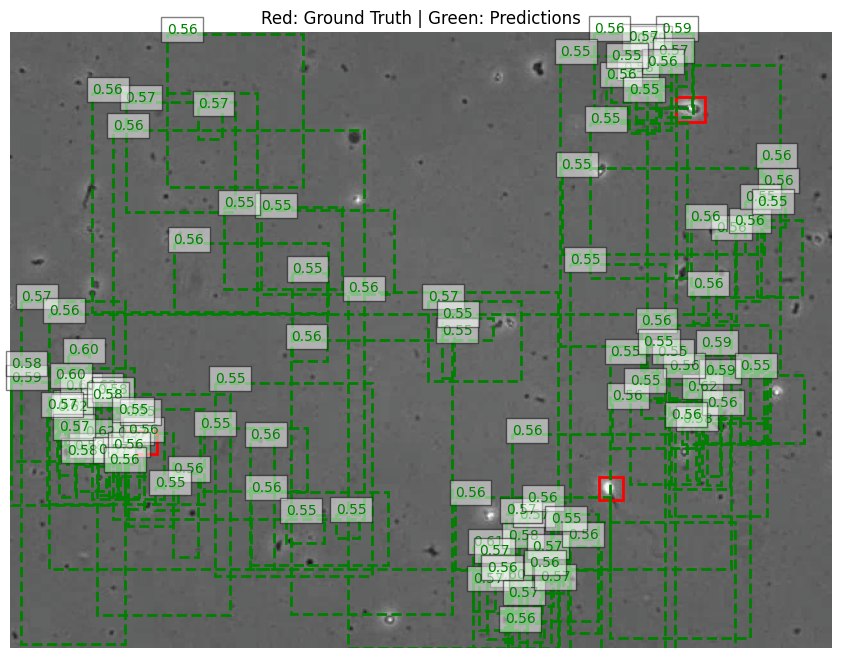

In [49]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches


def display_image_with_boxes(image, target, predictions, score_thresh=0.5):
    """
    Display the image with ground truth and predicted bounding boxes.
    
    Args:
        image (torch.Tensor): The image tensor.
        target (dict): Dictionary containing ground truth boxes and labels.
        predictions (dict): Dictionary containing predicted boxes, labels, and scores.
        score_thresh (float): Threshold for displaying predicted boxes.
    """
    # Convert image tensor to numpy array and denormalize
    img = image.permute(1, 2, 0).cpu().numpy()
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = (img * std + mean).clip(0, 1)
    
    # Create figure and axis
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)
    
    # Draw ground truth boxes (in red)
    for box in target['boxes'].cpu().numpy():
        rect = patches.Rectangle(
            (box[0], box[1]), 
            box[2] - box[0], 
            box[3] - box[1], 
            linewidth=2, 
            edgecolor='r', 
            facecolor='none'
        )
        ax.add_patch(rect)
    
    # Draw predicted boxes (in green) with scores above threshold
    scores = predictions['scores'].cpu().numpy()
    boxes = predictions['boxes'].cpu().numpy()
    for box, score in zip(boxes, scores):
        if score > score_thresh:
            rect = patches.Rectangle(
                (box[0], box[1]), 
                box[2] - box[0], 
                box[3] - box[1], 
                linewidth=2, 
                edgecolor='g', 
                facecolor='none',
                linestyle='--'
            )
            ax.add_patch(rect)
            ax.text(
                box[0], 
                box[1], 
                f'{score:.2f}', 
                color='g', 
                fontsize=10, 
                bbox=dict(facecolor='white', alpha=0.5)
            )
    
    plt.axis('off')
    plt.title('Red: Ground Truth | Green: Predictions')
    plt.show()

# Example usage:
# Get a sample from the validation dataset
img, target = val_dataset[0]
img = img.to(device)
model.eval()
with torch.no_grad():
    predictions = model([img])[0]

# Display the image with boxes
display_image_with_boxes(img, target, predictions, score_thresh=0.55)